In [1]:
# YOLOv8 Weapon Detection Implementation
# This script implements weapon detection using YOLOv8 model

import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import torch
import shutil
from google.colab import drive, files
from tqdm.notebook import tqdm
import random
import zipfile
from PIL import Image

# Clone the repository containing the dataset
!git clone https://github.com/Mayur241202/Weapon-Detection.git
%cd /content/Weapon-Detection

# Install ultralytics for YOLOv8
!pip install ultralytics

# Create directories for results
results_dir = '/content/weapon_detection_results/YOLOv8'
os.makedirs(results_dir, exist_ok=True)

fatal: destination path 'Weapon-Detection' already exists and is not an empty directory.
/content/Weapon-Detection


In [8]:
from ultralytics import YOLO
import torch

class YOLOv8WeaponDetector:
    def __init__(self, data_dir, results_dir):
        self.data_dir = data_dir
        self.results_dir = results_dir
        self.model = None
        self.metrics = {}

    def prepare_data(self):
        """Prepare YAML configuration file for dataset"""
        print("Preparing dataset configuration...")

        # Create a YAML configuration file for the dataset
        data_yaml = f"{self.results_dir}/data.yaml"

        # Check dataset structure and create YAML file
        train_dir = os.path.join(self.data_dir, 'train/images')
        val_dir = os.path.join(self.data_dir, 'val/images')
        test_dir = os.path.join(self.data_dir, 'test/test')  # Fixed to correct path of the test images

        # Define weapon classes
        class_names = [
            "Automatic Rifle", "Bazooka", "Grenade Launcher", "Handgun",
            "Knife", "Shotgun", "SMG", "Sniper", "Sword"
        ]

        # Create YAML config
        with open(data_yaml, 'w') as f:
            f.write(f"path: {self.data_dir}\n")
            f.write(f"train: {train_dir}\n")
            f.write(f"val: {val_dir}\n")
            f.write(f"test: {test_dir}\n\n")

            f.write("names:\n")
            for i, cls in enumerate(class_names):
                f.write(f"  {i}: {cls}\n")

        print(f"Dataset configuration created at {data_yaml}")
        return data_yaml

    def train(self):
        """Train YOLOv8 model for weapon detection"""
        print("Training YOLOv8 model...")

        # Prepare dataset
        data_yaml = self.prepare_data()

        # Initialize YOLOv8 model (use yolov8n.pt for medium size model)
        self.model = YOLO('yolov8n.pt')  # Use yolov8n.pt for faster training

        # Train the model
        start_time = time.time()
        results = self.model.train(
            data=data_yaml,
            epochs=60,
            imgsz=640,
            batch=16,
            patience=10,
            save=True,
            project=self.results_dir,
            name='train_results'
        )
        training_time = time.time() - start_time

        # Evaluate the model
        print("Evaluating YOLOv8 model...")
        eval_results = self.model.val(
            data=data_yaml,
            project=self.results_dir,
            name='eval_results'
        )

        # Extract and save metrics
        self.metrics = {
            'mAP50': eval_results.box.map50,
            'mAP50-95': eval_results.box.map,
            'precision': eval_results.box.mp,
            'recall': eval_results.box.mr,
            'inference_time': eval_results.speed['inference'],
            'training_time': training_time
        }

        self.save_metrics()
        return self.metrics

    def save_metrics(self):
        """Save performance metrics to CSV and TXT"""
        metrics_df = pd.DataFrame([self.metrics])
        metrics_df.to_csv(f"{self.results_dir}/metrics.csv", index=False)

        # Also save as readable text
        with open(f"{self.results_dir}/metrics_summary.txt", 'w') as f:
            f.write(f"Performance Metrics for YOLOv8:\n")
            f.write("-" * 40 + "\n")
            for metric, value in self.metrics.items():
                f.write(f"{metric}: {value:.4f}\n")

        print(f"Metrics saved to {self.results_dir}")

    def visualize_results(self, num_samples=5):
        """Visualize some detection results"""
        print("Visualizing detection results...")

        # Create directory for visualizations
        vis_dir = os.path.join(self.results_dir, 'visualizations')
        os.makedirs(vis_dir, exist_ok=True)

        # Get some test images
        test_images_dir = os.path.join(self.data_dir, 'test/test')  # Fixed to correct test path
        if not os.path.exists(test_images_dir) or len(os.listdir(test_images_dir)) == 0:
            # If no test images, try validation images
            test_images_dir = os.path.join(self.data_dir, 'val/images')

        # If still no images, use sorted_images folder
        if not os.path.exists(test_images_dir) or len(os.listdir(test_images_dir)) == 0:
            sorted_images_dir = os.path.join(self.data_dir, 'sorted_images')
            if os.path.exists(sorted_images_dir):
                test_images = []
                for root, _, files in os.walk(sorted_images_dir):
                    for file in files:
                        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                            test_images.append(os.path.join(root, file))

                # Select random images
                if len(test_images) > num_samples:
                    test_images = random.sample(test_images, num_samples)
            else:
                print("No test images found!")
                return
        else:
            # Get image files from test directory
            test_images = [os.path.join(test_images_dir, f) for f in os.listdir(test_images_dir)
                          if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

            # Select random images
            if len(test_images) > num_samples:
                test_images = random.sample(test_images, num_samples)

        # Perform detection and save visualizations
        for i, img_path in enumerate(test_images):
            results = self.model.predict(img_path, conf=0.25)

            # Get the image with detections
            for r in results:
                im_array = r.plot()  # plot a BGR numpy array of predictions
                im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image

                # Save the visualization
                output_path = os.path.join(vis_dir, f"detection_{i+1}.jpg")
                im.save(output_path)
                print(f"Saved visualization to {output_path}")

    def zip_results(self):
        """Zip the results folder for easy download"""
        print("Zipping results...")

        zip_path = f"{self.results_dir}.zip"
        with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
            for root, _, files_in_dir in os.walk(self.results_dir):
                for file in files_in_dir:
                    file_path = os.path.join(root, file)
                    zipf.write(file_path, os.path.relpath(file_path, os.path.dirname(self.results_dir)))

        print(f"Results zipped to {zip_path}")

        return zip_path


# Main execution
if __name__ == "__main__":
    # Check for GPU availability
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Define paths
    data_dir = '/content/Weapon-Detection/Weapon Project/weapon_detection'  # Corrected path

    # Train and evaluate YOLOv8 model
    detector = YOLOv8WeaponDetector(data_dir, results_dir)
    metrics = detector.train()

    # Visualize results
    detector.visualize_results()

    # Zip and download results
    detector.zip_results()

    print("YOLOv8 weapon detection complete!")

Using device: cuda
Training YOLOv8 model...
Preparing dataset configuration...
Dataset configuration created at /content/weapon_detection_results/YOLOv8/data.yaml
Ultralytics 8.3.131 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/weapon_detection_results/YOLOv8/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosa

train: Scanning /content/Weapon-Detection/Weapon Project/weapon_detection/train/labels.cache... 571 images, 0 backgrounds, 0 corrupt: 100%|██████████| 571/571 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 460.9±185.9 MB/s, size: 74.1 KB)


val: Scanning /content/Weapon-Detection/Weapon Project/weapon_detection/val/labels.cache... 143 images, 0 backgrounds, 0 corrupt: 100%|██████████| 143/143 [00:00<?, ?it/s]


Plotting labels to /content/weapon_detection_results/YOLOv8/train_results5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/weapon_detection_results/YOLOv8/train_results5
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/60      2.04G      1.142       3.53      1.408         35        640: 100%|██████████| 36/36 [00:15<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

                   all        143        219    0.00658      0.975      0.182      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/60      2.32G      1.121      2.939      1.381         40        640: 100%|██████████| 36/36 [00:15<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.98it/s]

                   all        143        219      0.345      0.234      0.197      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/60      2.32G      1.122      2.607      1.378         47        640: 100%|██████████| 36/36 [00:14<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.18it/s]

                   all        143        219      0.262      0.459      0.275      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/60      2.32G      1.127      2.469      1.381         27        640: 100%|██████████| 36/36 [00:14<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        143        219      0.215      0.407      0.247      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/60      2.32G      1.113      2.322      1.374         39        640: 100%|██████████| 36/36 [00:14<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

                   all        143        219      0.353      0.468       0.41      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/60      2.32G      1.104      2.168      1.361         42        640: 100%|██████████| 36/36 [00:15<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.37it/s]


                   all        143        219      0.418      0.463      0.417      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/60      2.32G      1.085      2.081      1.341         49        640: 100%|██████████| 36/36 [00:16<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.50it/s]

                   all        143        219      0.441      0.481      0.494      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/60      2.34G      1.067      2.047      1.333         49        640: 100%|██████████| 36/36 [00:14<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.28it/s]

                   all        143        219      0.578      0.568      0.546      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/60      2.34G      1.026       1.94      1.305         38        640: 100%|██████████| 36/36 [00:14<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.60it/s]

                   all        143        219      0.584      0.458      0.552      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/60      2.34G      1.019      1.829      1.288         37        640: 100%|██████████| 36/36 [00:15<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.33it/s]


                   all        143        219      0.573      0.573      0.597      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/60      2.34G      1.008      1.778       1.28         44        640: 100%|██████████| 36/36 [00:15<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        143        219      0.537       0.63      0.585      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/60      2.34G     0.9747      1.735      1.269         48        640: 100%|██████████| 36/36 [00:15<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

                   all        143        219      0.621      0.578      0.622      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/60      2.34G     0.9871      1.659      1.252         38        640: 100%|██████████| 36/36 [00:15<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]

                   all        143        219      0.565      0.531      0.529      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/60      2.36G     0.9572      1.636      1.255         44        640: 100%|██████████| 36/36 [00:15<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.69it/s]

                   all        143        219      0.651      0.673      0.711      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/60      2.36G     0.9413      1.553      1.241         67        640: 100%|██████████| 36/36 [00:15<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]

                   all        143        219      0.679      0.608      0.678      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/60      2.36G     0.9517      1.523      1.233         39        640: 100%|██████████| 36/36 [00:15<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]


                   all        143        219      0.678      0.626      0.703      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/60      2.36G     0.9523      1.519      1.242         40        640: 100%|██████████| 36/36 [00:16<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        143        219      0.615      0.652      0.681      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/60      2.36G     0.9241      1.431       1.23         33        640: 100%|██████████| 36/36 [00:15<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

                   all        143        219      0.615      0.726       0.69      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/60      2.38G     0.9113      1.402      1.216         38        640: 100%|██████████| 36/36 [00:15<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.59it/s]

                   all        143        219      0.785      0.673      0.774       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/60      2.39G     0.8652      1.339      1.184         45        640: 100%|██████████| 36/36 [00:15<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        143        219      0.693      0.732      0.776       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/60      2.39G     0.8858      1.329      1.196         45        640: 100%|██████████| 36/36 [00:14<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

                   all        143        219      0.719      0.721      0.734      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/60      2.39G     0.8909       1.25      1.188         34        640: 100%|██████████| 36/36 [00:15<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.58it/s]

                   all        143        219      0.787      0.725      0.814        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/60      2.39G     0.8808      1.251      1.197         40        640: 100%|██████████| 36/36 [00:14<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.17it/s]

                   all        143        219      0.802      0.657      0.773      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/60      2.39G     0.8293      1.173      1.156         48        640: 100%|██████████| 36/36 [00:15<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.85it/s]

                   all        143        219      0.759      0.676      0.777      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/60      2.39G     0.8779      1.247      1.181         40        640: 100%|██████████| 36/36 [00:16<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

                   all        143        219      0.786      0.743      0.814      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/60      2.39G      0.815      1.152      1.156         37        640: 100%|██████████| 36/36 [00:15<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.97it/s]

                   all        143        219      0.751      0.764      0.833      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/60      2.39G     0.8359      1.176      1.173         31        640: 100%|██████████| 36/36 [00:15<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.46it/s]

                   all        143        219      0.834      0.765      0.836       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/60      2.41G     0.8386      1.119       1.15         58        640: 100%|██████████| 36/36 [00:15<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.41it/s]

                   all        143        219      0.723      0.719      0.769      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/60      2.43G     0.8115      1.071      1.145         55        640: 100%|██████████| 36/36 [00:15<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.97it/s]

                   all        143        219       0.76      0.779      0.821      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/60      2.43G     0.8341      1.059      1.159         41        640: 100%|██████████| 36/36 [00:15<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

                   all        143        219      0.807      0.774       0.81      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/60      2.43G     0.8089      1.063      1.135         40        640: 100%|██████████| 36/36 [00:15<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.01it/s]

                   all        143        219       0.76      0.742      0.786      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/60      2.43G     0.8042      1.026      1.158         49        640: 100%|██████████| 36/36 [00:15<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

                   all        143        219      0.792      0.725      0.821      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/60      2.43G     0.7927      1.001      1.139         35        640: 100%|██████████| 36/36 [00:16<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.17it/s]

                   all        143        219      0.846      0.755       0.84      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/60      2.43G     0.7566     0.9854       1.11         42        640: 100%|██████████| 36/36 [00:15<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

                   all        143        219      0.772      0.821      0.833      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/60      2.43G     0.7862     0.9886      1.124         37        640: 100%|██████████| 36/36 [00:16<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.10it/s]

                   all        143        219       0.82      0.759      0.818      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/60      2.43G     0.7787     0.9656      1.117         43        640: 100%|██████████| 36/36 [00:17<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

                   all        143        219      0.828      0.792      0.852      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/60      2.43G      0.744     0.9247      1.109         53        640: 100%|██████████| 36/36 [00:15<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.92it/s]

                   all        143        219      0.808       0.79       0.85      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/60      2.43G     0.7344     0.9005      1.097         36        640: 100%|██████████| 36/36 [00:15<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

                   all        143        219      0.839      0.744      0.842      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/60      2.43G     0.7279        0.9      1.095         47        640: 100%|██████████| 36/36 [00:15<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.41it/s]

                   all        143        219      0.831      0.761      0.849      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/60      2.43G     0.7365     0.9017       1.12         48        640: 100%|██████████| 36/36 [00:17<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.80it/s]


                   all        143        219      0.876      0.805      0.872      0.683

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/60      2.43G     0.7284     0.8686      1.094         59        640: 100%|██████████| 36/36 [00:15<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.80it/s]

                   all        143        219      0.767      0.837      0.844       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/60      2.43G     0.7148     0.8587       1.09         48        640: 100%|██████████| 36/36 [00:15<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.74it/s]

                   all        143        219      0.845      0.798      0.848      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/60      2.43G     0.7199     0.8521      1.094         45        640: 100%|██████████| 36/36 [00:14<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

                   all        143        219       0.82        0.8       0.85      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/60      2.43G     0.7043     0.8332      1.093         36        640: 100%|██████████| 36/36 [00:16<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.18it/s]

                   all        143        219      0.799      0.771      0.818      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/60      2.43G     0.7145     0.8114       1.08         48        640: 100%|██████████| 36/36 [00:15<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

                   all        143        219       0.81      0.815      0.834       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/60      2.43G     0.7292     0.8114      1.103         68        640: 100%|██████████| 36/36 [00:15<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.39it/s]

                   all        143        219      0.872      0.773      0.841      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/60      2.43G     0.6761     0.7886      1.068         42        640: 100%|██████████| 36/36 [00:16<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.95it/s]


                   all        143        219      0.794      0.819      0.857       0.69

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/60      2.43G     0.6874     0.7791      1.087         45        640: 100%|██████████| 36/36 [00:16<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.46it/s]

                   all        143        219      0.864      0.779      0.865      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/60      2.43G     0.6836     0.7723      1.071         51        640: 100%|██████████| 36/36 [00:19<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

                   all        143        219       0.85      0.784      0.849      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/60      2.43G      0.666     0.7595       1.06         51        640: 100%|██████████| 36/36 [00:18<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        143        219      0.861        0.8      0.864      0.696


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/60      2.43G     0.5631     0.7019      1.033         18        640: 100%|██████████| 36/36 [00:17<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

                   all        143        219      0.821      0.819      0.853      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/60      2.43G     0.5314     0.6288      1.015         18        640: 100%|██████████| 36/36 [00:15<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

                   all        143        219      0.843       0.81      0.866      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/60      2.43G     0.5367     0.6136      1.008         19        640: 100%|██████████| 36/36 [00:15<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]

                   all        143        219      0.852      0.792      0.853      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/60      2.43G     0.5174     0.5956      1.003         14        640: 100%|██████████| 36/36 [00:15<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

                   all        143        219      0.877      0.772      0.859      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/60      2.43G     0.5101     0.5569     0.9886         21        640: 100%|██████████| 36/36 [00:16<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

                   all        143        219      0.833      0.782      0.842       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/60      2.43G     0.5192     0.5757     0.9952         15        640: 100%|██████████| 36/36 [00:15<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

                   all        143        219      0.847      0.775      0.855      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/60      2.43G     0.5036     0.5664      1.003         14        640: 100%|██████████| 36/36 [00:14<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.55it/s]

                   all        143        219      0.822       0.81      0.853      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/60      2.43G     0.4996     0.5659      1.004         21        640: 100%|██████████| 36/36 [00:15<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.24it/s]


                   all        143        219      0.813      0.829      0.836      0.675

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/60      2.43G     0.4897     0.5442     0.9855         17        640: 100%|██████████| 36/36 [00:15<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

                   all        143        219      0.806       0.83      0.832      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/60      2.43G     0.4775     0.5462     0.9843         15        640: 100%|██████████| 36/36 [00:16<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

                   all        143        219      0.791      0.848      0.841      0.686


EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 50, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

60 epochs completed in 0.312 hours.
Optimizer stripped from /content/weapon_detection_results/YOLOv8/train_results5/weights/last.pt, 6.3MB
Optimizer stripped from /content/weapon_detection_results/YOLOv8/train_results5/weights/best.pt, 6.3MB

Validating /content/weapon_detection_results/YOLOv8/train_results5/weights/best.pt...
Ultralytics 8.3.131 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,403 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.89it/s]


                   all        143        219      0.861        0.8      0.864      0.696
       Automatic Rifle         15         20      0.643        0.7      0.705      0.608
               Bazooka         13         16      0.709      0.688      0.585      0.448
      Grenade Launcher         18         24      0.843      0.958      0.939      0.729
               Handgun         14         38      0.921      0.917      0.969      0.796
                 Knife         14         19      0.978      0.895      0.968      0.748
               Shotgun         16         22      0.894      0.767      0.862      0.662
                   SMG         17         28      0.913      0.746      0.927      0.782
                Sniper         18         30      0.961      0.667      0.861      0.736
                 Sword         18         22      0.884      0.864      0.962      0.758
Speed: 0.2ms preprocess, 3.0ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to /content/we

val: Scanning /content/Weapon-Detection/Weapon Project/weapon_detection/val/labels.cache... 143 images, 0 backgrounds, 0 corrupt: 100%|██████████| 143/143 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.47it/s]


                   all        143        219      0.861      0.798      0.865      0.699
       Automatic Rifle         15         20      0.644        0.7       0.71      0.614
               Bazooka         13         16      0.713      0.688      0.584      0.451
      Grenade Launcher         18         24      0.845      0.958      0.941      0.732
               Handgun         14         38       0.92       0.91       0.97      0.799
                 Knife         14         19      0.981      0.895      0.972      0.751
               Shotgun         16         22      0.894      0.764      0.864       0.67
                   SMG         17         28      0.912      0.739      0.917       0.78
                Sniper         18         30      0.963      0.667      0.861      0.732
                 Sword         18         22      0.881      0.864      0.962      0.767
Speed: 2.5ms preprocess, 4.0ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to /content/we

📊 Displaying all images...


**train_batch0.jpg**

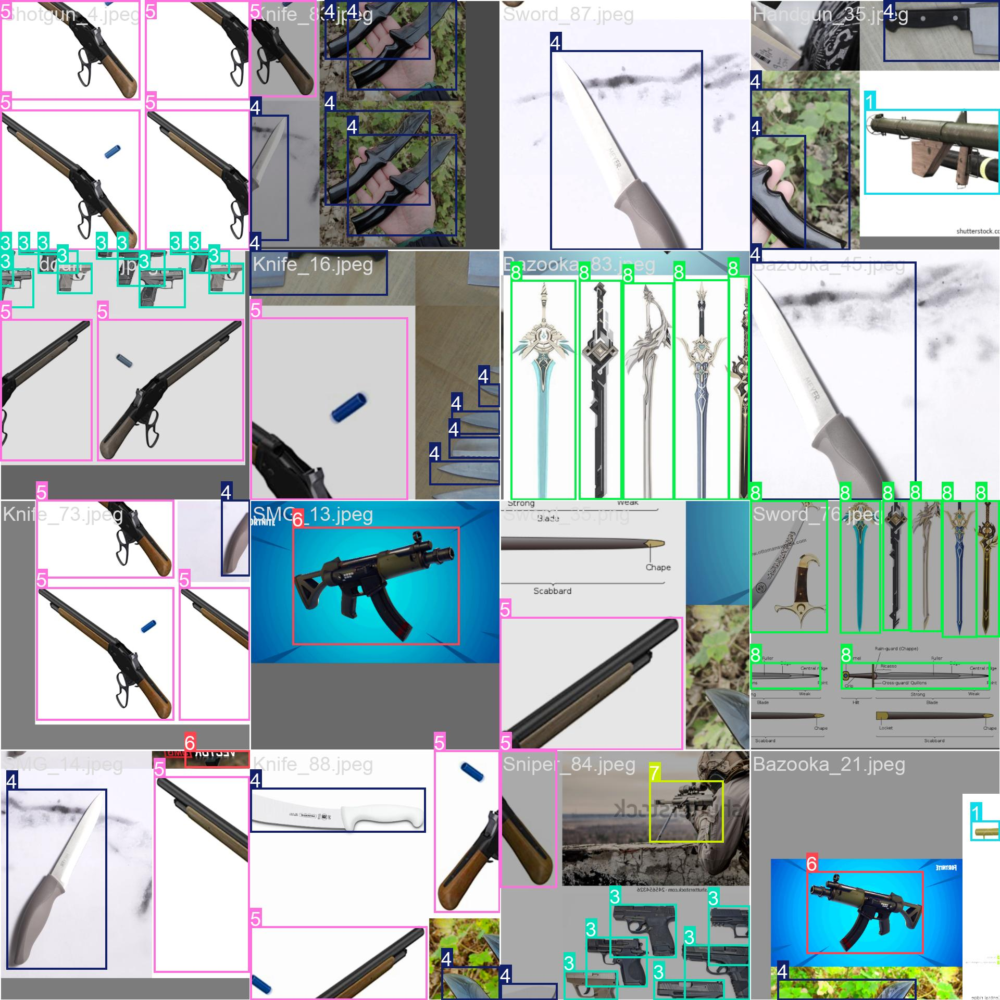

**val_batch0_pred.jpg**

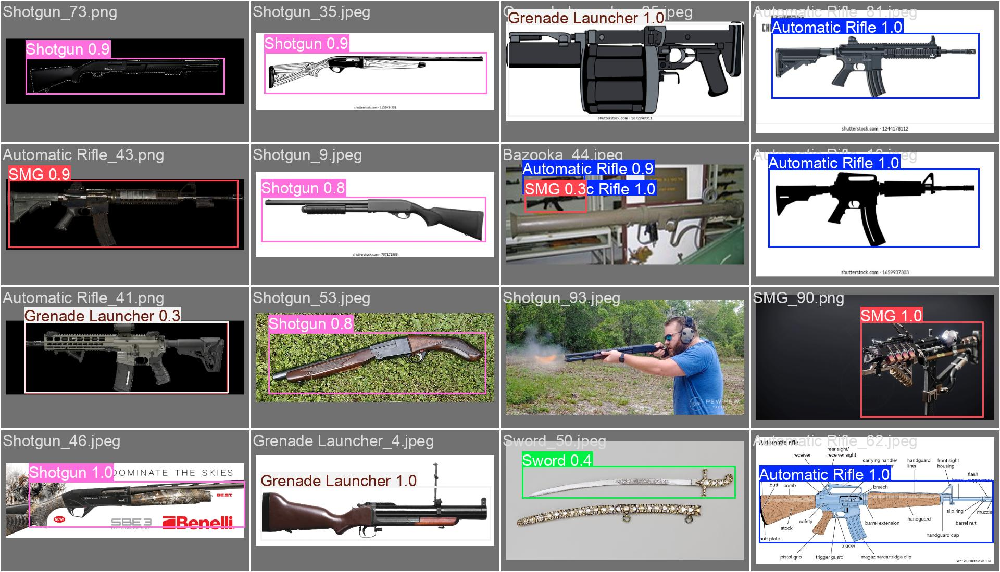

**train_batch1801.jpg**

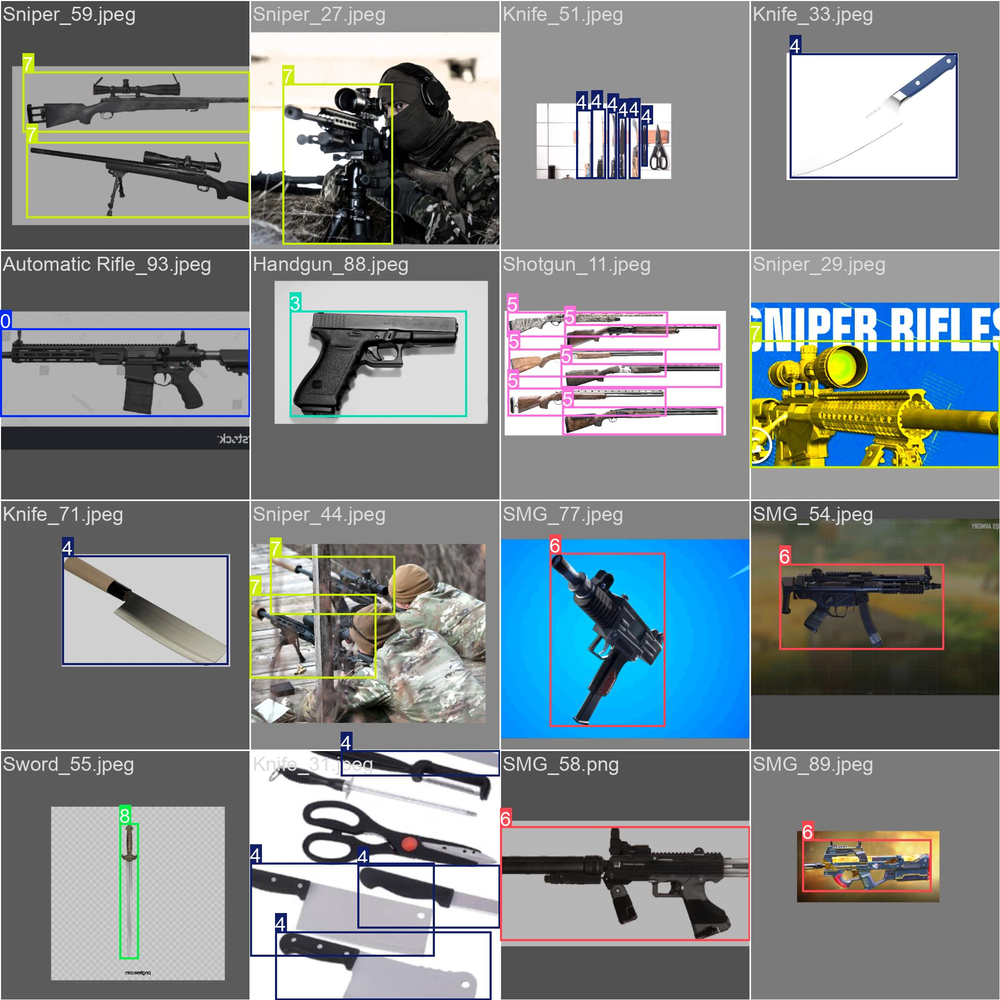

**confusion_matrix.png**

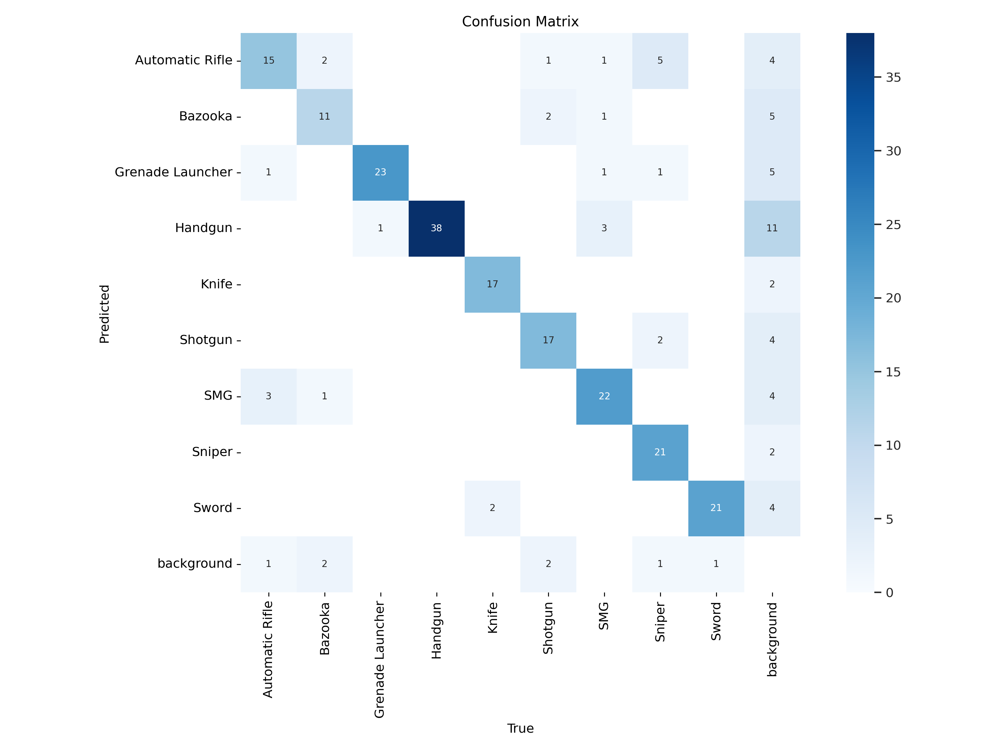

**train_batch1802.jpg**

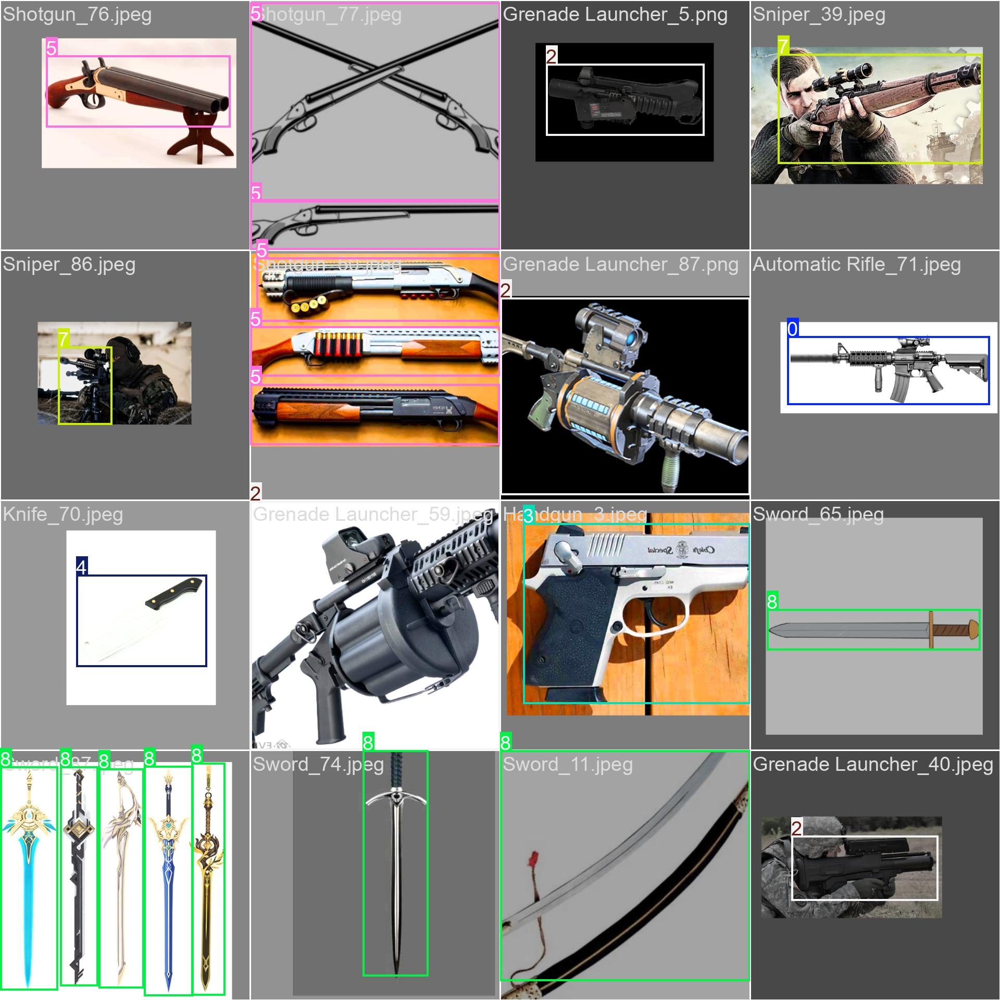

**R_curve.png**

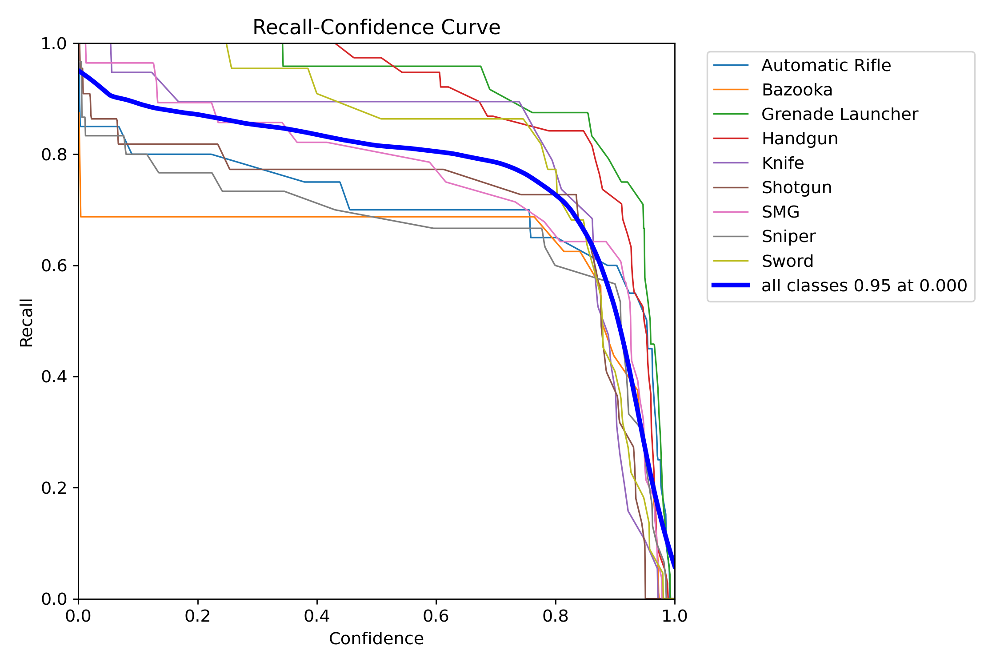

**results.png**

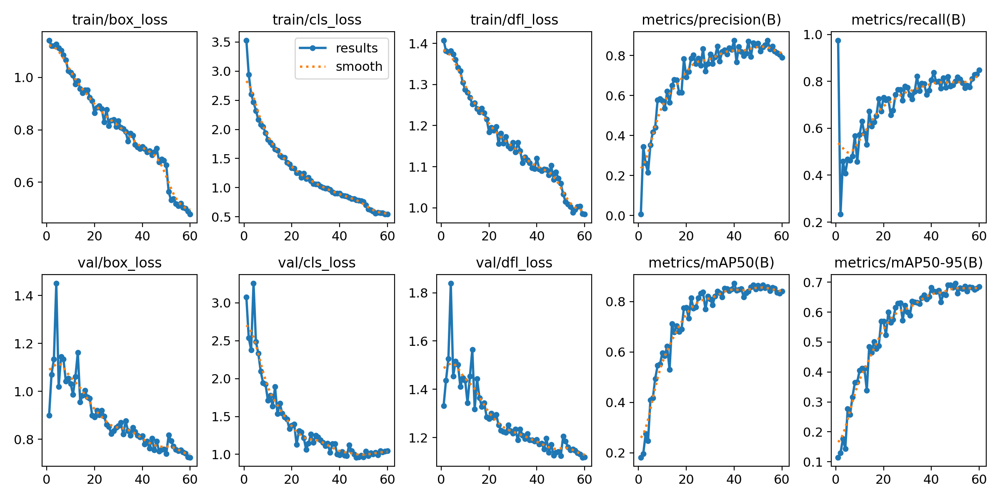

**val_batch0_labels.jpg**

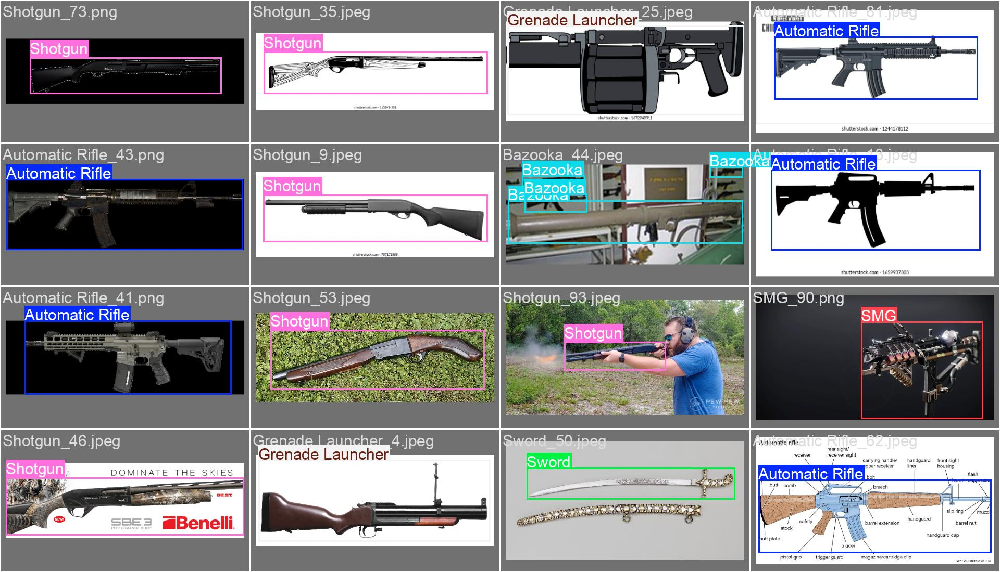

**train_batch1.jpg**

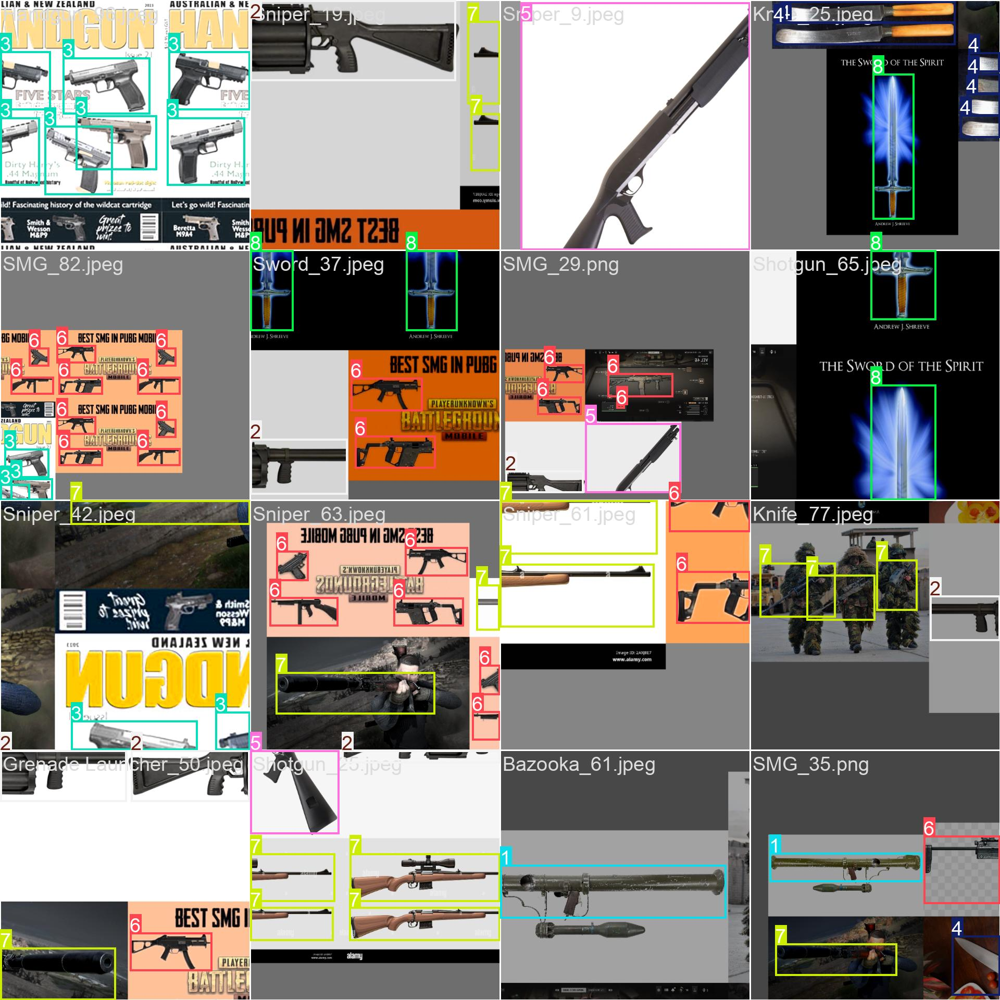

**val_batch2_pred.jpg**

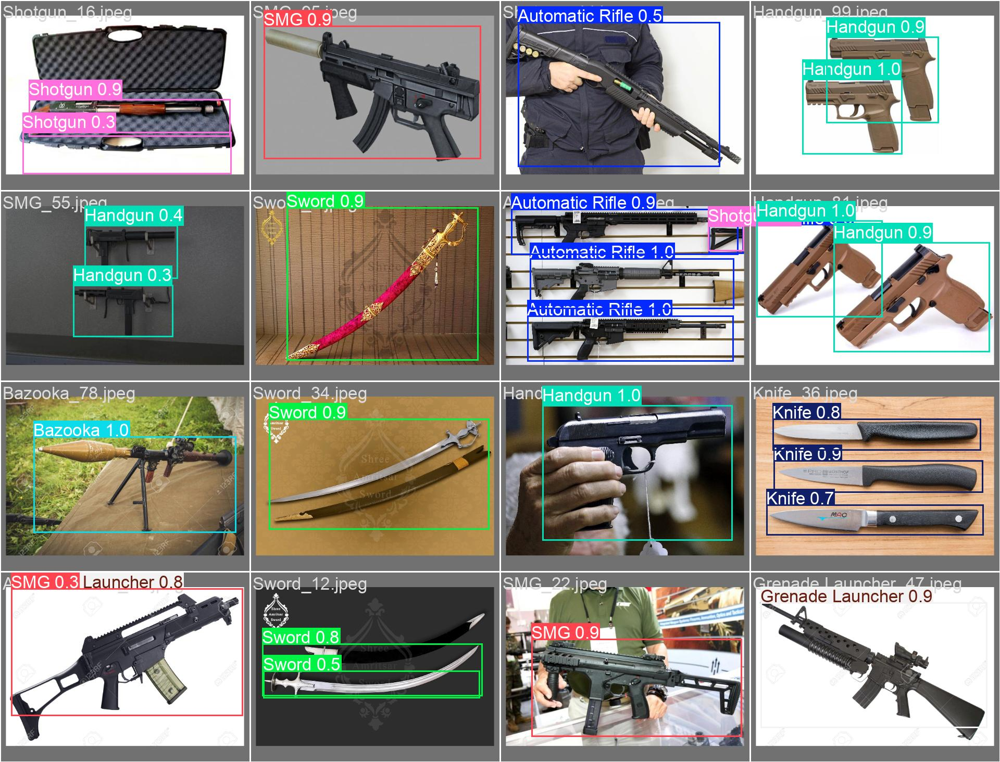

**labels.jpg**

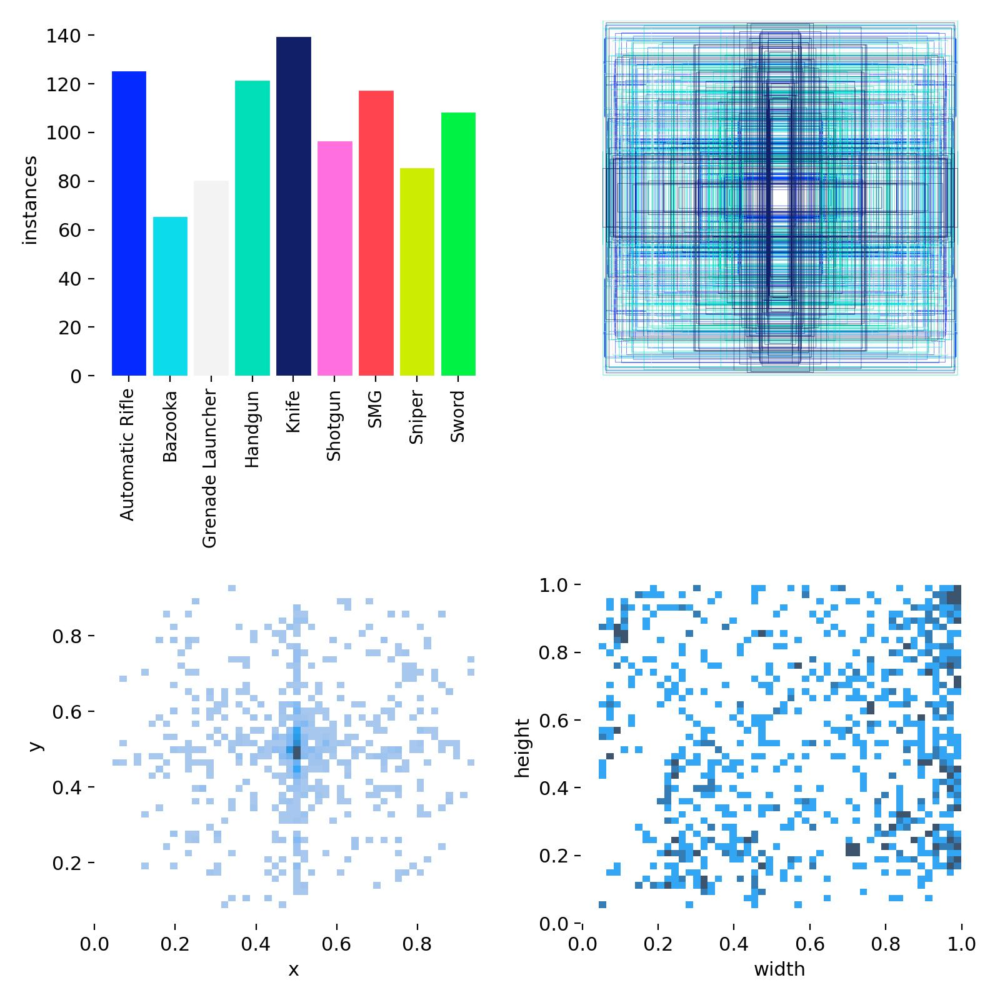

**train_batch1800.jpg**

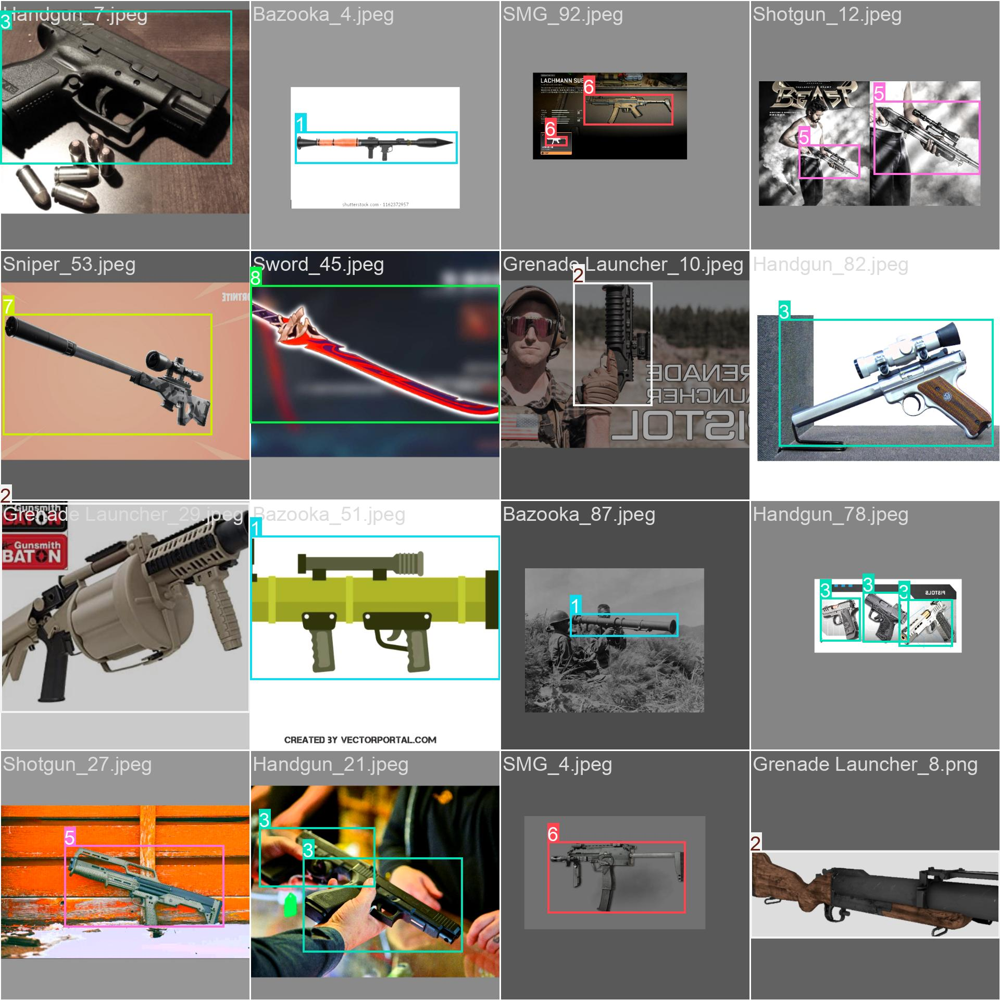

**train_batch2.jpg**

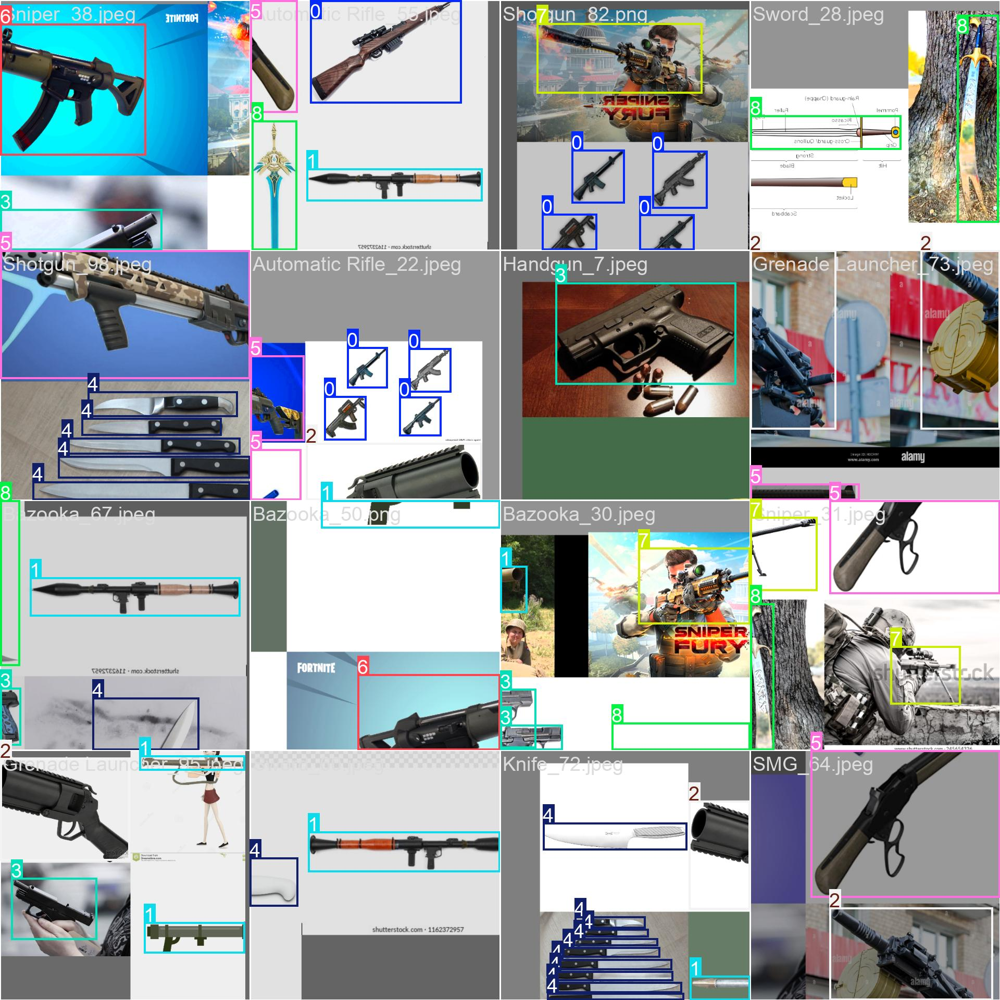

**PR_curve.png**

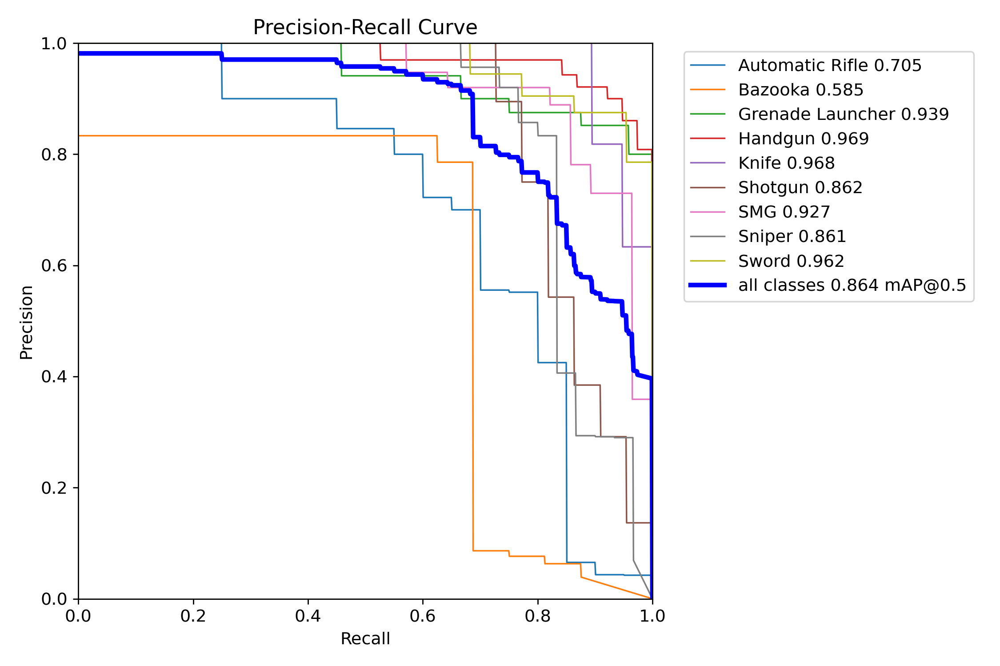

**labels_correlogram.jpg**

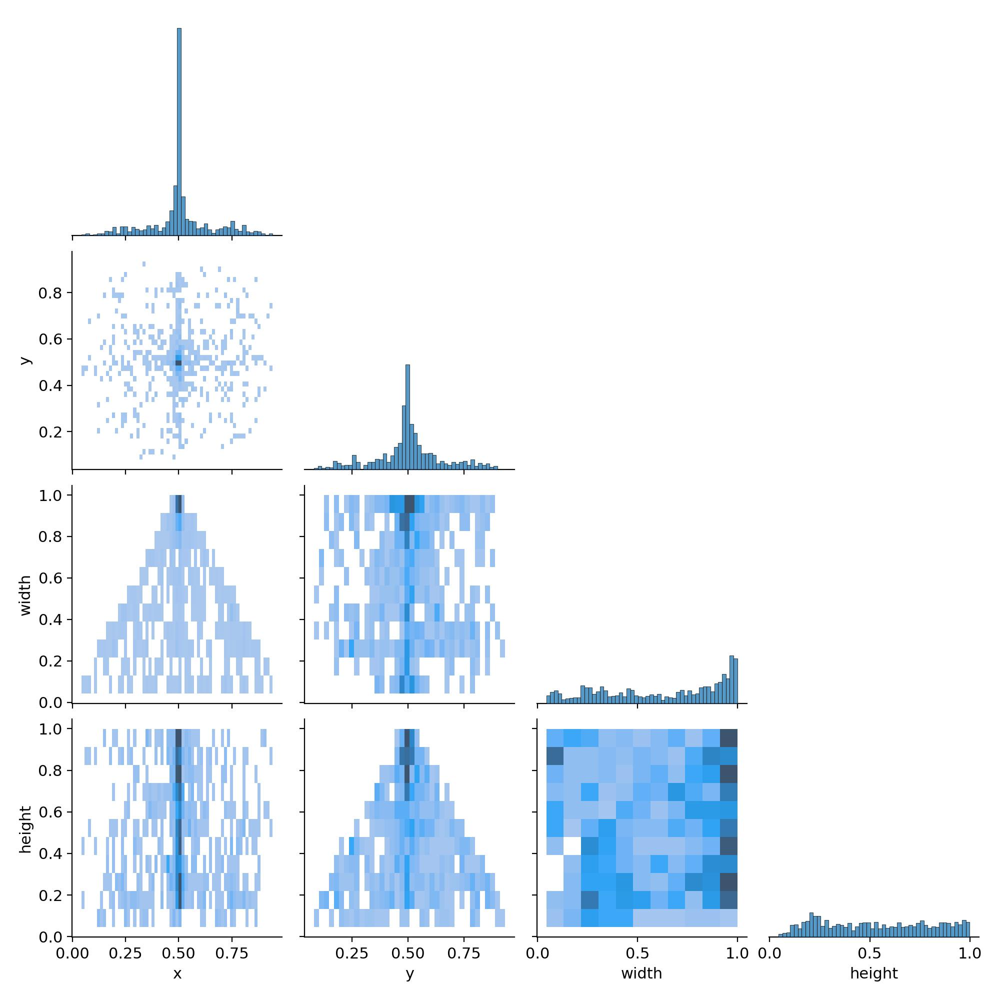

**F1_curve.png**

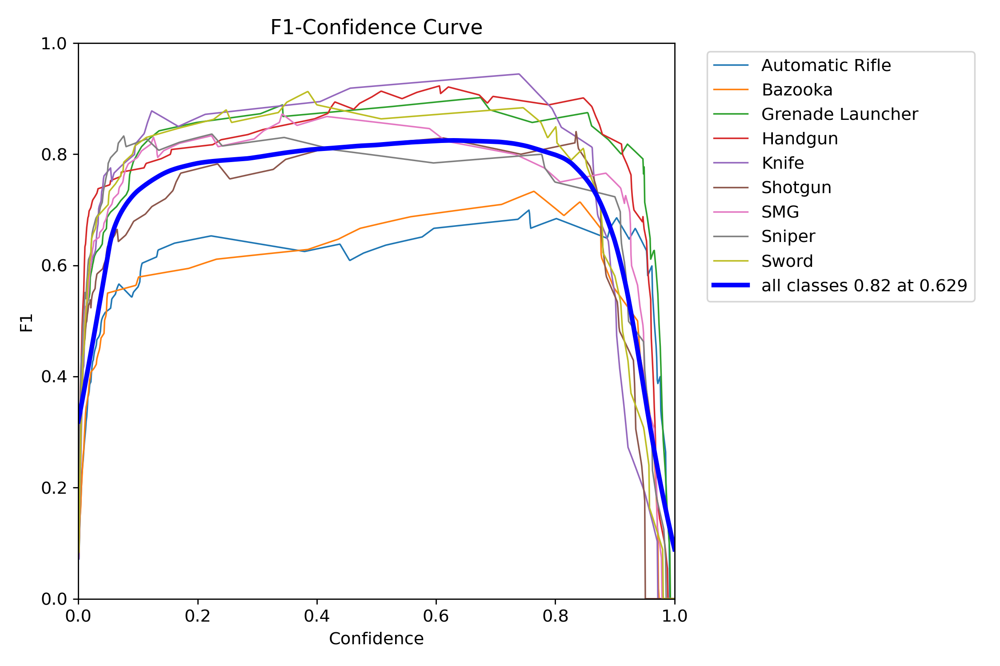

**confusion_matrix_normalized.png**

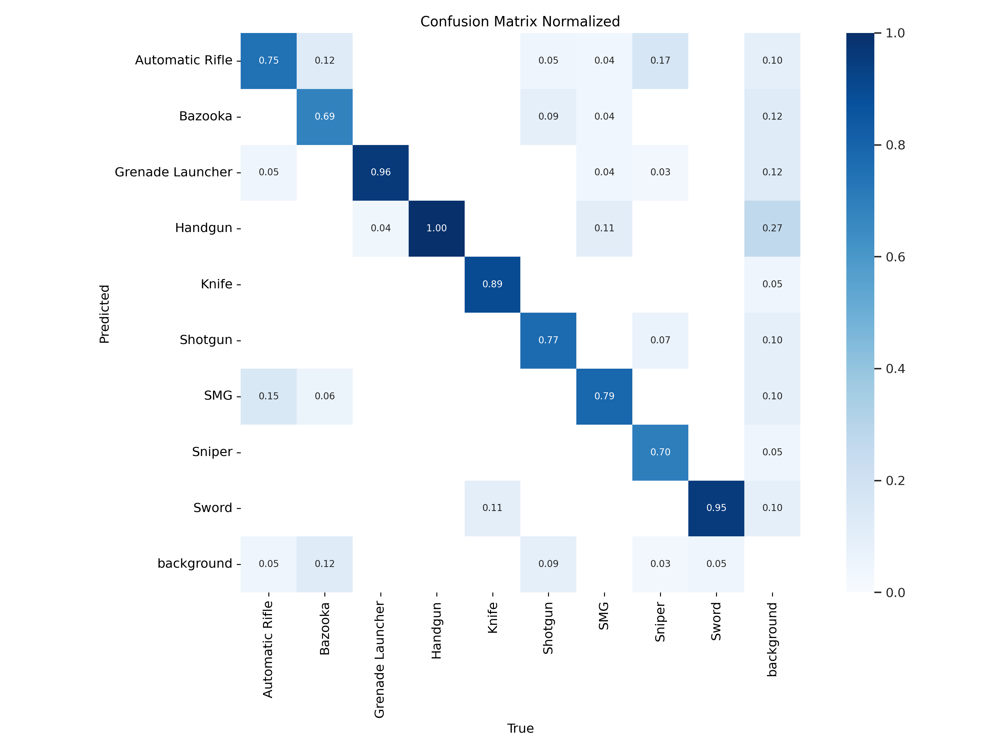

**val_batch1_pred.jpg**

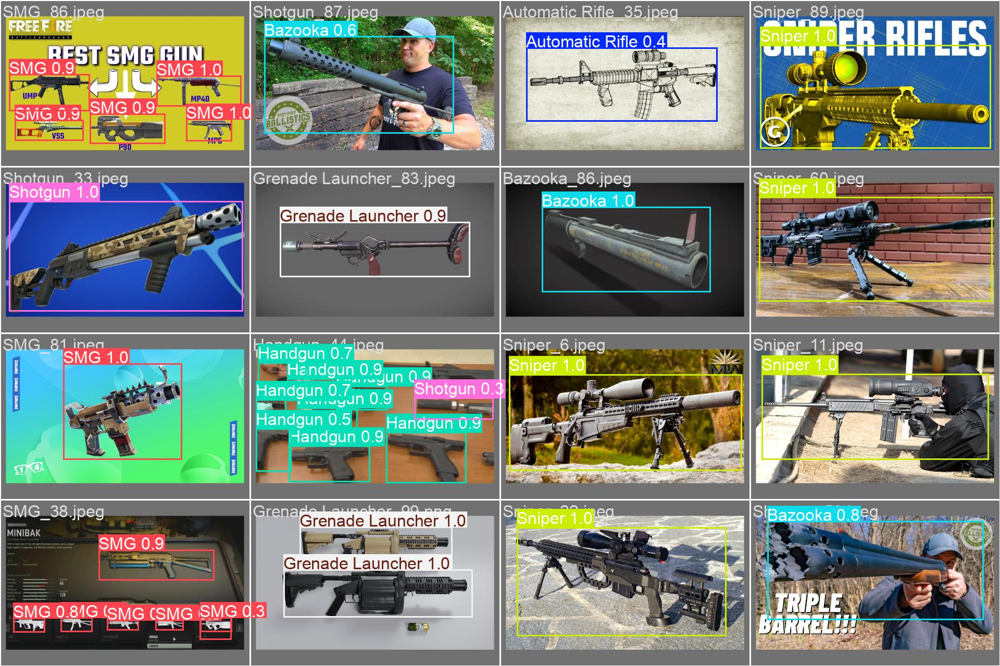

**P_curve.png**

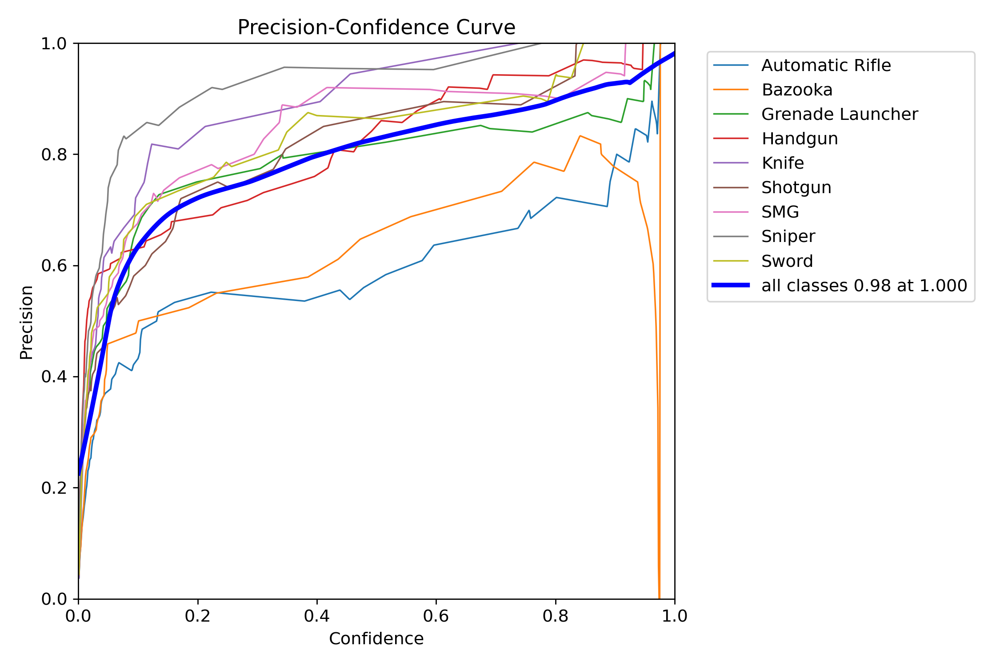

**val_batch2_labels.jpg**

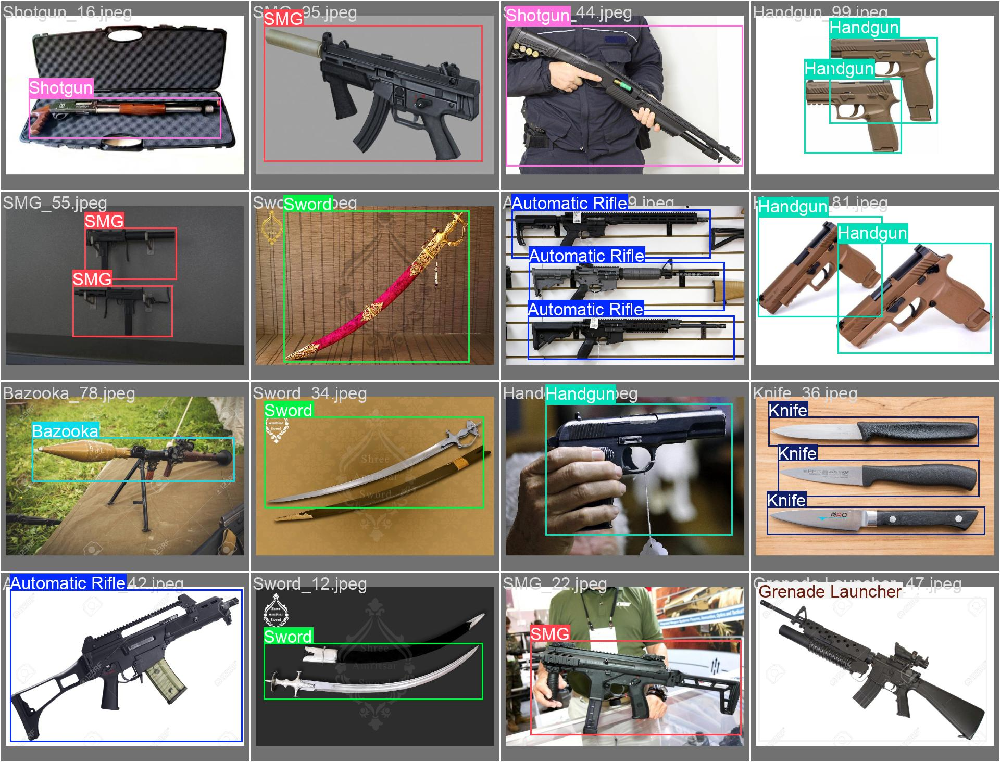

**val_batch1_labels.jpg**

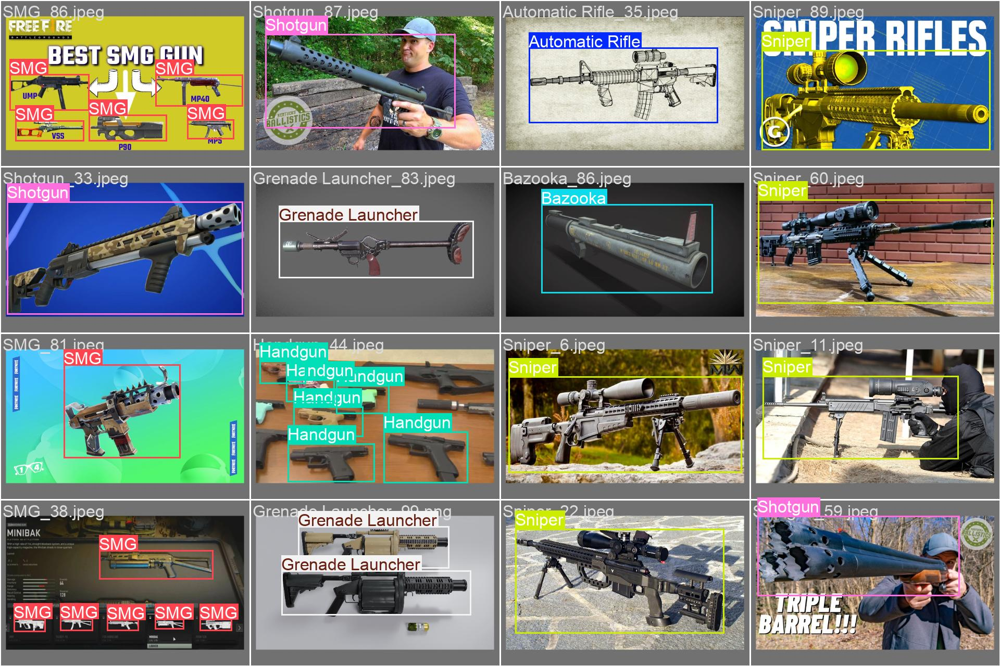

📈 Loading and displaying all CSV files...


### `results.csv` (Preview)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,17.8090,1.14233,3.52999,1.40766,0.00658,0.97525,0.18230,0.11456,0.89994,3.07568,1.33223,0.000249,0.000249,0.000249
1,2,37.0668,1.12060,2.93939,1.38145,0.34462,0.23355,0.19726,0.12891,1.07014,2.53702,1.43734,0.000497,0.000497,0.000497
2,3,54.7132,1.12165,2.60657,1.37833,0.26206,0.45857,0.27507,0.17693,1.13429,2.37969,1.52653,0.000737,0.000737,0.000737
3,4,73.2712,1.12657,2.46896,1.38139,0.21510,0.40744,0.24711,0.14318,1.45060,3.25839,1.83904,0.000731,0.000731,0.000731
4,5,90.3680,1.11289,2.32156,1.37364,0.35321,0.46759,0.40988,0.27659,1.01855,2.48734,1.45380,0.000718,0.000718,0.000718


❗ No training loss data found.
❗ No evaluation metrics data found.


In [11]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display, Markdown

class YOLOv8WeaponResultsVisualizer:
    def __init__(self, results_dir):
        self.results_dir = results_dir
        self.train_results_dir = os.path.join(results_dir, 'train_results5')

    def display_all_images(self):
        """Display all .png and .jpg images in the results directory"""
        print("📊 Displaying all images...")
        for file in os.listdir(self.train_results_dir):
            if file.endswith(('.png', '.jpg')):
                file_path = os.path.join(self.train_results_dir, file)
                display(Markdown(f"**{file}**"))
                display(Image(filename=file_path))

    def load_and_display_csvs(self):
        """Load and display all .csv files"""
        print("📈 Loading and displaying all CSV files...")
        for file in os.listdir(self.train_results_dir):
            if file.endswith('.csv'):
                file_path = os.path.join(self.train_results_dir, file)
                try:
                    df = pd.read_csv(file_path)
                    display(Markdown(f"### `{file}` (Preview)"))
                    display(df.head())  # Show first 5 rows
                    if 'epoch' in df.columns and 'loss' in df.columns:
                        self.loss_df = df
                    if 'mAP50' in df.columns:
                        self.metrics_df = df
                except Exception as e:
                    print(f"❌ Could not read {file}: {e}")

    def plot_training_loss(self):
        """Plot training loss if loaded"""
        if hasattr(self, 'loss_df'):
            plt.figure(figsize=(10, 5))
            plt.plot(self.loss_df['epoch'], self.loss_df['loss'], label='Training Loss', color='red')
            plt.title('Training Loss over Epochs')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.grid(True)
            plt.legend()
            plt.show()
        else:
            print("❗ No training loss data found.")

    def plot_eval_metrics(self):
        """Plot final evaluation metrics"""
        if hasattr(self, 'metrics_df'):
            metrics = {
                'mAP50': self.metrics_df['mAP50'].iloc[-1],
                'mAP50-95': self.metrics_df.get('mAP50-95', pd.Series([0])).iloc[-1],
                'Precision': self.metrics_df.get('precision', pd.Series([0])).iloc[-1],
                'Recall': self.metrics_df.get('recall', pd.Series([0])).iloc[-1]
            }
            plt.figure(figsize=(8, 5))
            sns.barplot(x=list(metrics.keys()), y=list(metrics.values()), palette='viridis')
            plt.title('Final Evaluation Metrics')
            plt.ylabel('Value')
            plt.grid(True)
            plt.show()
        else:
            print("❗ No evaluation metrics data found.")

# Main
if __name__ == "__main__":
    results_dir = '/content/weapon_detection_results/YOLOv8'
    visualizer = YOLOv8WeaponResultsVisualizer(results_dir)

    visualizer.display_all_images()
    visualizer.load_and_display_csvs()
    visualizer.plot_training_loss()
    visualizer.plot_eval_metrics()



image 1/1 /content/weapon_detection_results/YOLOv8/visualizations/detection_1.jpg: 448x640 (no detections), 8.5ms
Speed: 2.1ms preprocess, 8.5ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)


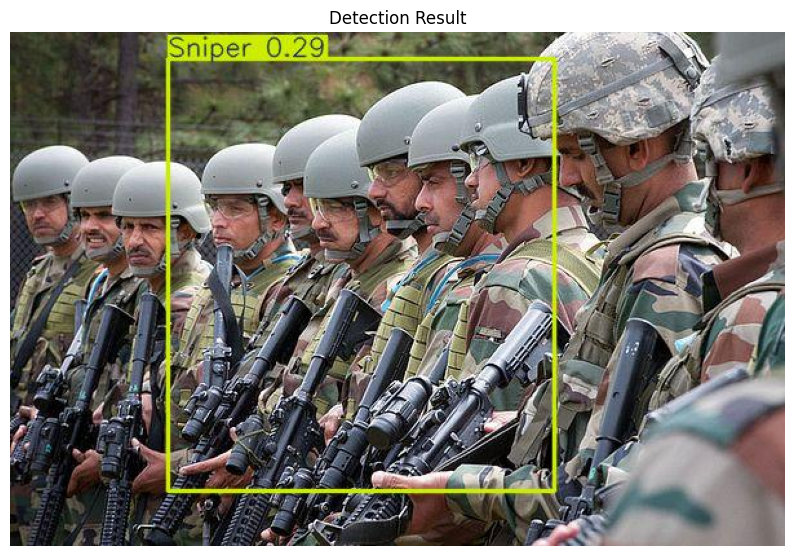

In [16]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import torch

# Load model
model = YOLO('/content/weapon_detection_results/YOLOv8/train_results5/weights/best.pt')  # Replace with your trained YOLOv8 model path

# Image path
image_path = '/content/weapon_detection_results/YOLOv8/visualizations/detection_1.jpg'  # Replace with your test image path

# Run inference
results = model.predict(image_path, conf=0.25)

# Display the image with bounding boxes
for r in results:
    # r.plot() returns a NumPy array (BGR)
    im_array = r.plot()
    im_rgb = Image.fromarray(im_array[..., ::-1])  # Convert BGR to RGB

    # Plot using matplotlib
    plt.figure(figsize=(10, 8))
    plt.imshow(im_rgb)
    plt.axis('off')
    plt.title("Detection Result")
    plt.show()